# scVelo

Following https://scvelo.readthedocs.io/VelocityBasics.html.

In [1]:
import scvelo as scv
import scanpy as sc
from matplotlib import rcParams
import pandas as pd
import numpy as np

SURAG CHANGED utils.py


In [2]:
scv.set_figure_params('scvelo')  # for beautified visualization

## Load Data

In [119]:
rna = scv.read('./sessions/20200913_n27632/seurat_with_velocyto.h5ad', cache=True)

In [120]:
rna

AnnData object with n_obs × n_vars = 59369 × 27624
    obs: 'nCount_RNA', 'nFeature_RNA', 'sample', 'percent.mt', 'selected', 'percent.or', 'RNA_snn_res.1', 'seurat_clusters', 'RNA_snn_res.0.5', 'Clusters', '_X', '_Y', 'batch', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    obsm: 'X_pca', 'X_umap'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

### Cluster Config

In [ ]:
cluster_config = pd.read_csv("../../figures_factory/configs/cluster.tsv", sep='\t')
cluster_config

### ATAC Transfer Labels

In [ ]:
atac_rna_label = pd.read_csv("../20200828_RNA_Seurat/sessions/20200913_n27632/atac.20200520_n68916.cluster.transfer.tsv", sep='\t')

print(all(atac_rna_label['barcode']==rna.obs.index)) 

# transfer to new cluster idxs
atac_rna_label['atac_new_cluster'] = list(cluster_config.iloc[atac_rna_label['atac_cluster']-1]["new_cluster"])

atac_rna_label.head()

In [7]:
atac_rna_label["atac_new_cluster"]

0         1
1         1
2         2
3         1
4         2
         ..
59364    15
59365    15
59366     5
59367    16
59368    16
Name: atac_new_cluster, Length: 59369, dtype: int64

In [8]:
rna.obs["atac_transfer_cluster"] = list([str(x) for x in atac_rna_label["atac_new_cluster"]])

In [9]:
rna.obs

,nCount_RNA,nFeature_RNA,sample,percent.mt,selected,percent.or,RNA_snn_res.1,seurat_clusters,RNA_snn_res.0.5,Clusters,_X,_Y,batch,initial_size_spliced,initial_size_unspliced,initial_size,atac_transfer_cluster
AAACCCAAGAGTGACC-1,12431.0,3300,D0,4.231357,0.0,0.0,0,0,0,3,37.983864,1.342879,0,10348,1655,10348.0,1
AAACCCAAGTGCCAGA-1,11132.0,3304,D0,5.821056,1.0,0.0,0,0,0,2,-0.992394,-40.176418,0,9137,2978,9137.0,1
AAACCCACACCATTCC-1,13101.0,3788,D0,4.121823,0.0,0.0,7,0,0,4,-31.284298,-4.380585,0,10847,3375,10847.0,2
AAACCCACACGCGTCA-1,7944.0,2612,D0,4.770896,1.0,0.0,0,0,0,8,33.433483,-18.001648,0,6617,1289,6617.0,1
AAACCCAGTCCATAGT-1,10934.0,3080,D0,6.036217,0.0,0.0,7,0,0,1,24.493044,11.682897,0,8805,2050,8805.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGGTCCTGGTG-8,11675.0,3241,D14,13.678801,0.0,0.0,8,7,7,8,9.603167,-10.555494,7,7790,3245,7790.0,15
TTTGTTGGTCGTTATG-8,19498.0,4105,D14,6.385270,0.0,0.0,8,7,7,2,-37.382172,17.400143,7,14104,3687,14104.0,15
TTTGTTGGTCTGTCAA-8,9651.0,3197,D14,6.652160,0.0,0.0,11,12,12,5,-3.070083,-27.396564,7,7063,2865,7063.0,5
TTTGTTGTCCCTGGTT-8,18084.0,4037,D14,7.039372,0.0,0.0,1,10,10,7,-15.810957,-14.819410,7,13085,3364,13085.0,16


## RNA Velocity

### Stats

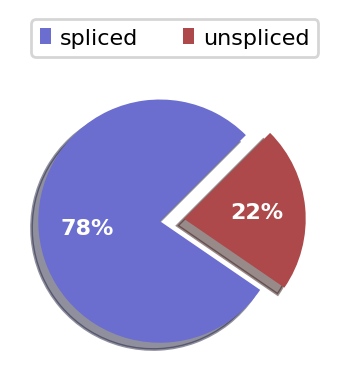

In [11]:
scv.pl.proportions(rna)

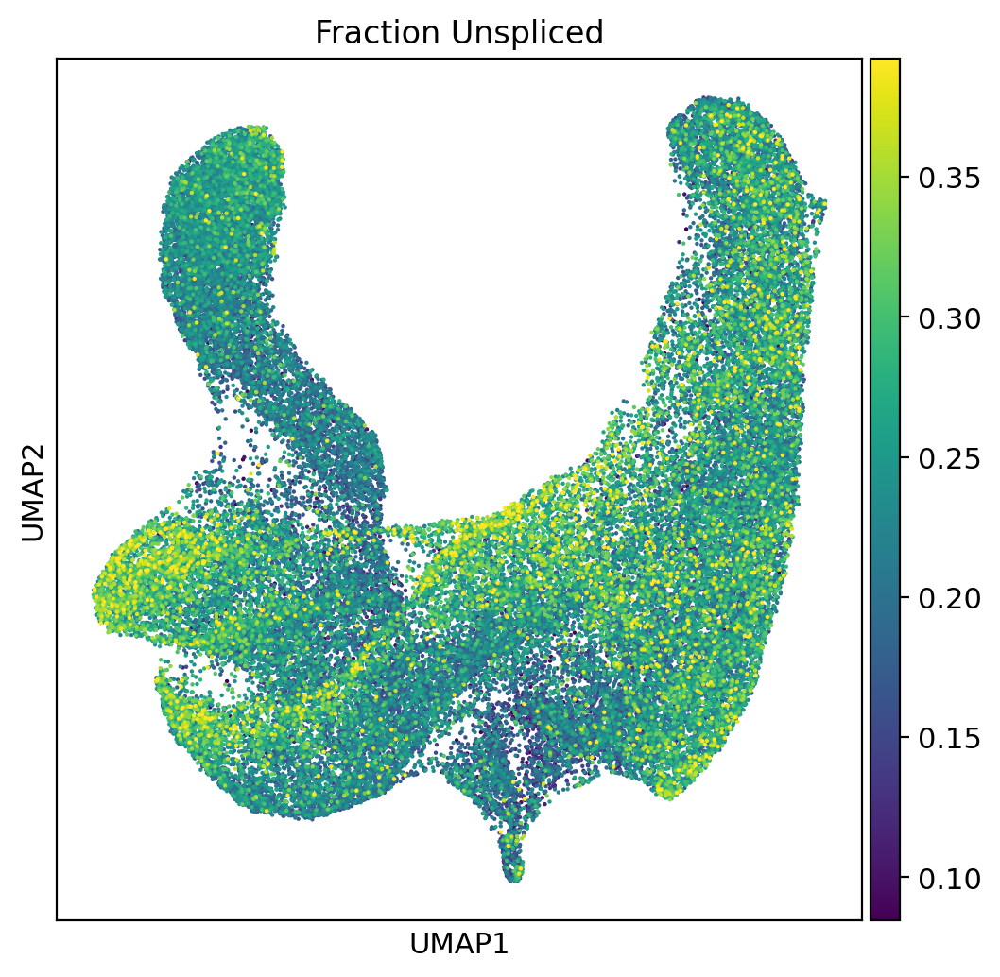

In [404]:
rcParams['figure.figsize'] = 6,6

# single-cell ratio of spliced to unspliced
rna.obs['tmp'] = rna.obs["initial_size_unspliced"]/(rna.obs["initial_size_spliced"]+rna.obs["initial_size_unspliced"])
sc.pl.umap(rna, color="tmp", title="Fraction Unspliced", vmin='p1', vmax='p99', size=10, cmap='viridis')

### Preprocess

In [122]:
scv.pp.filter_and_normalize(rna, min_shared_counts=200, n_top_genes=2000)
scv.pp.moments(rna, n_pcs=30, n_neighbors=30)

Filtered out 15227 genes that are detected 100 counts (shared).
Normalized count data: spliced, unspliced.
Exctracted 4000 highly variable genes.
computing neighbors
    finished (0:00:27) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:19) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [ ]:
# for dynamical (~4-5 hours)
scv.tl.recover_dynamics(rna)

In [123]:
scv.tl.velocity(rna, mode='stochastic')

computing velocities
    finished (0:00:52) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [124]:
scv.tl.velocity_graph(rna)

SURAG UNCOMMENTED velocity_graph.py
computing velocity graph
    finished (0:18:31) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [366]:
# control null
scv.utils.randomized_velocity(rna)

SURAG UNCOMMENTED velocity_graph.py
computing velocity graph
    finished (0:19:04) --> added 
    'velocity_random_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:17) --> added
    'velocity_random_umap', embedded velocity vectors (adata.obsm)


## Plot

computing velocity embedding
    finished (0:00:18) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


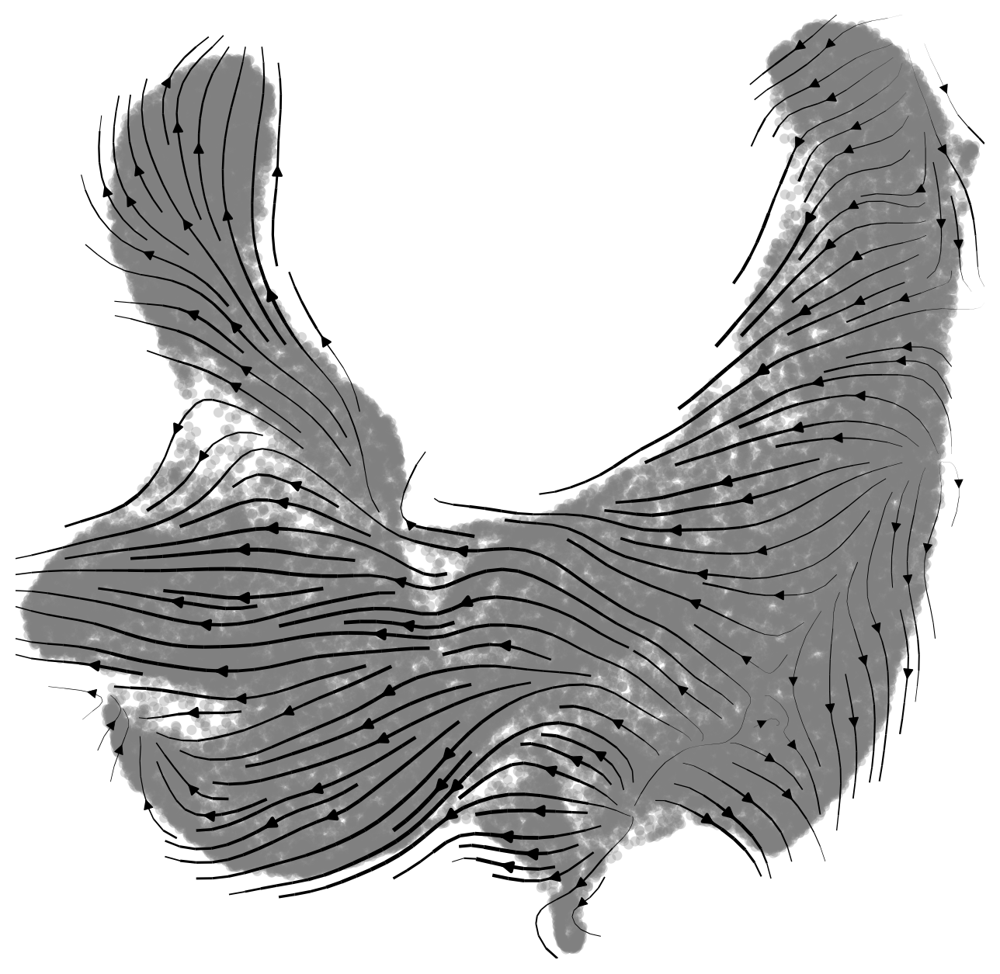

In [13]:
rcParams['figure.figsize'] = 8, 8
# without mean centering (SURAG edits)
scv.pl.velocity_embedding_stream(rna, 
                                 basis='umap', 
                                 cutoff_perc=0, 
#                                  color="seurat_clusters",
#                                  save='stream.png',
#                                  dpi=120
                                )

computing velocity embedding
    finished (0:00:16) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


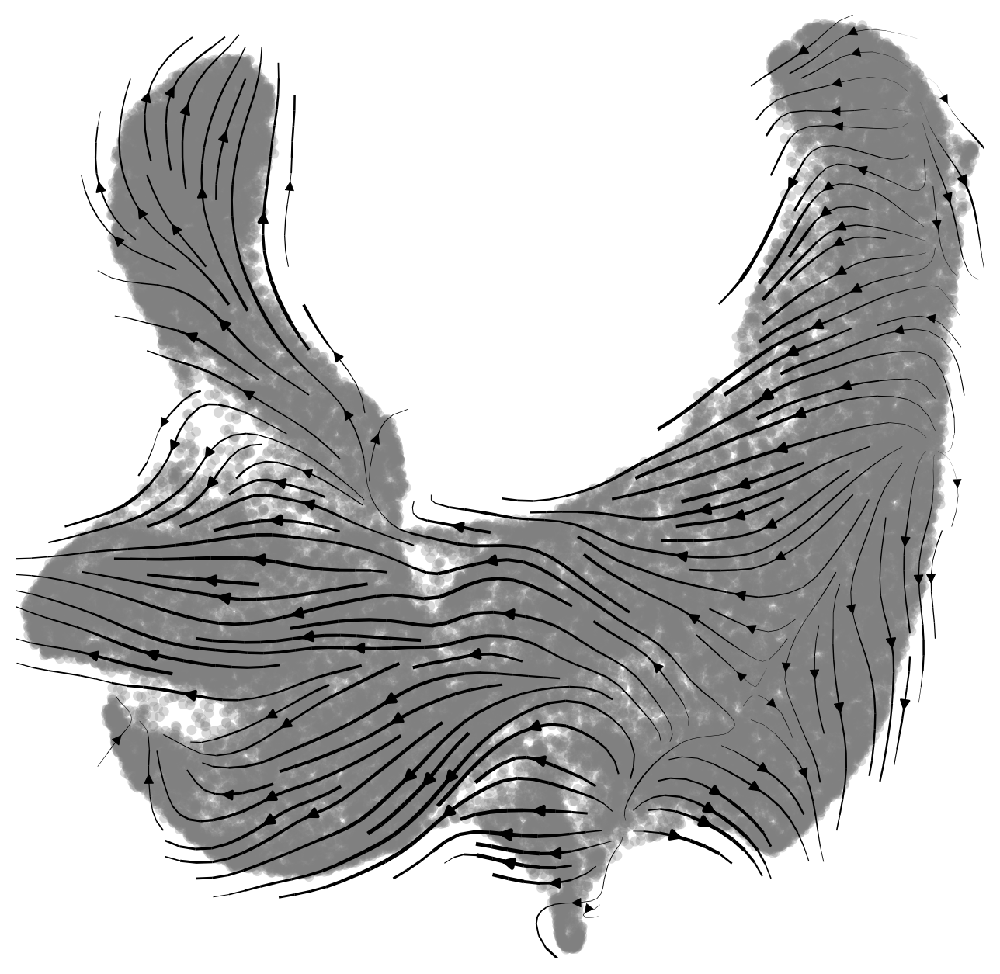

In [1071]:
rcParams['figure.figsize'] = 8, 8

scv.pl.velocity_embedding_stream(rna, 
                                 basis='umap', 
                                 cutoff_perc=0, 
#                                  color="seurat_clusters",
#                                  save='stream.png',
#                                  dpi=120
                                )

computing velocity embedding
    finished (0:00:17) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)
saving figure to file ./figures/scvelo_stream.dynamical.png


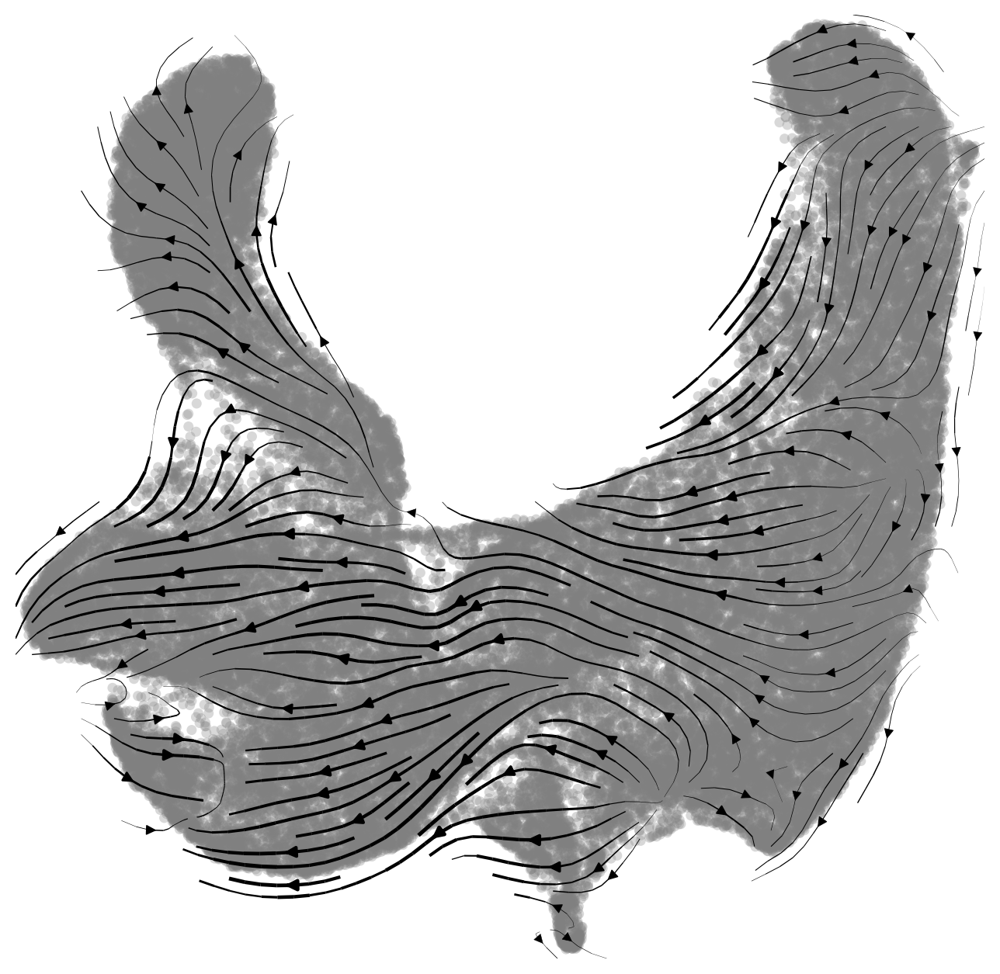

In [326]:
rcParams['figure.figsize'] = 8, 8

# dynamical
scv.pl.velocity_embedding_stream(rna, 
                                 basis='umap', 
                                 cutoff_perc=0, 
#                                  color="seurat_clusters",
                                 save='stream.dynamical.png',
#                                  dpi=120
                                )

saving figure to file ./figures/scvelo_embedding.pdf


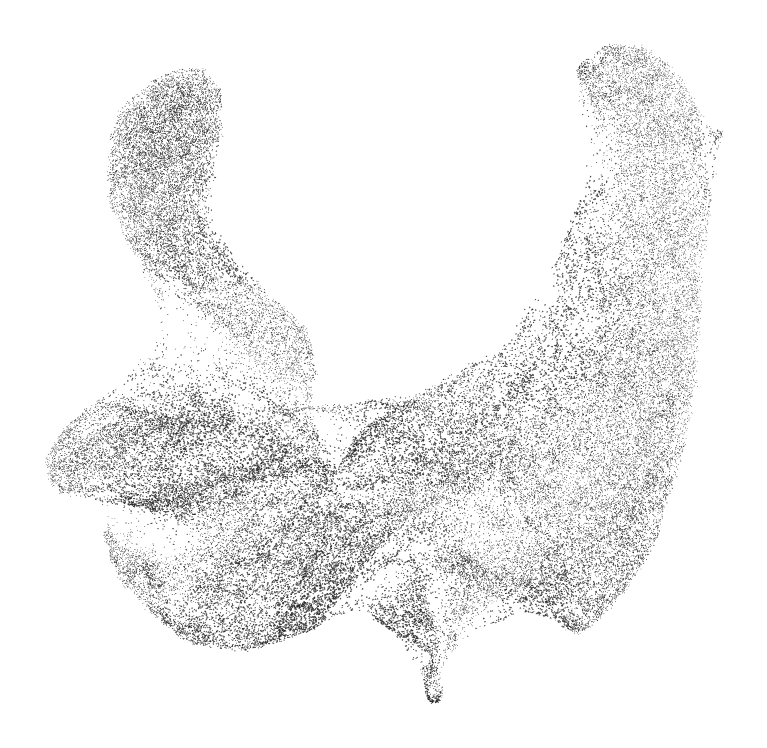

In [78]:
rcParams['figure.figsize'] = 8, 8

scv.pl.velocity_embedding(rna, 
                          arrow_length=3, 
                          arrow_size=5, 
                          dpi=120, 
                          save='embedding.pdf')

In [1059]:
# write a session
rna.write('sessions/20200913_n27632/dynamical.h5ad')

### Important Genes

In [88]:
scv.tl.rank_velocity_genes(rna, groupby='atac_transfer_cluster', min_corr=.3)

ranking velocity genes
    finished (0:00:37) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


In [120]:
df = scv.DataFrame(rna.uns['rank_velocity_genes']['names'])
df.head(10)

,1,10,11,12,13,14,15,16,17,2,3,4,5,6,7,8,9
0,MALAT1,NFIX,FAM162A,FIRRE,SUCLA2,LDLRAD4,WNK2,CALB1,ITGA10,BNC2,PIEZO2,BTBD11,PECAM1,TNS1,DDX21,NCAM1,SYNE1
1,EMP1,GSN,LDB2,SEMA3E,TRIM71,LINC02086,CALB1,ABHD12B,CD9,FN1,ST6GALNAC3,FAP,IGDCC4,ZCCHC24,GSN,DDX21,EDIL3
2,NR4A1,B2M,MEIS1,CD70,ENPP1,CD70,SNHG14,AC084375.1,TIMP3,EMP1,ZBTB20,RFX8,AC112721.2,DNM1,CCBE1,TUBA1C,COL5A2
3,SGIP1,P4HA2,SFRP1,ANGPT1,DPH6,SNTG1,PROM1,SPINK5,IGFBP7,SPARC,BACH2,GLIS3,DLC1,NFIX,HSPA8,P2RX5,RNF125
4,THBS1,BNIP3,NR2F1,AC084198.2,WNK2,EBF1,DACT1,VASH2,SRPX2,TNC,BNIP3L,NTM,SPON2,HSPG2,RPS20,NFIX,MBNL3
5,ATF3,ANGPTL4,PCLO,LAMC2,SCARA5,PCDH7,SPINK5,LINC00678,ACPP,SMAD3,CCDC102B,CDH13,ITGA10,CPE,TUBA1C,GPX4,ROBO1
6,ANTXR1,TMEM45A,ANGPT1,A4GALT,ZNF486,KCNN3,TRIM71,DACT1,CTHRC1,MYLK,NREP,ADAM19,PALM2-AKAP2,ABLIM3,COL11A1,B2M,CDH6
7,TIPARP,COL21A1,NR1H4,WNT16,SEMA6A,PURPL,CDH8,COL9A3,SPON2,TRHDE,MEIS1,BMERB1,ADAM19,FBLN2,STMN2,NPTXR,COL11A1
8,TPM1,CPE,ZBTB20,ENPP1,PURPL,RAPGEF5,CD70,MIR302CHG,ANO1,NR4A1,SMAD3,PALM2-AKAP2,CNIH3,C1orf21,ROBO1,TPM2,LYPLAL1-DT
9,COL4A5,COL3A1,TMEM45A,DPH6,RAB3B,ITGAV,CDHR1,AC105460.1,AC112721.2,EXT1,C1QTNF7,ABLIM3,TUBA1A,MICALL2,SERPINB1,MBNL3,BNIP3


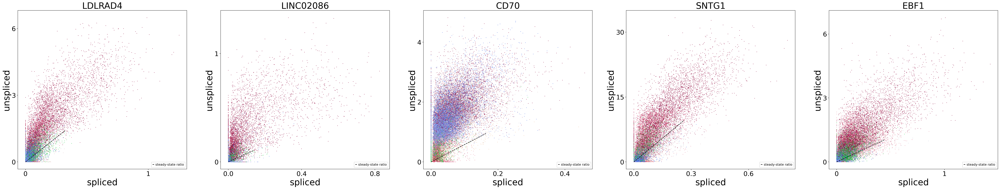

In [117]:
rcParams['figure.figsize'] = 12, 10

kwargs = dict(frameon=True, fontsize=30, size=10, color="atac_transfer_cluster", linewidth=1.5)
scv.pl.scatter(rna, df['14'][:5], **kwargs)

In [ ]:
rcParams['figure.figsize'] = 8, 8

sc.pl.umap(rna, color="atac_transfer_cluster", legend_loc='on data', size=5)

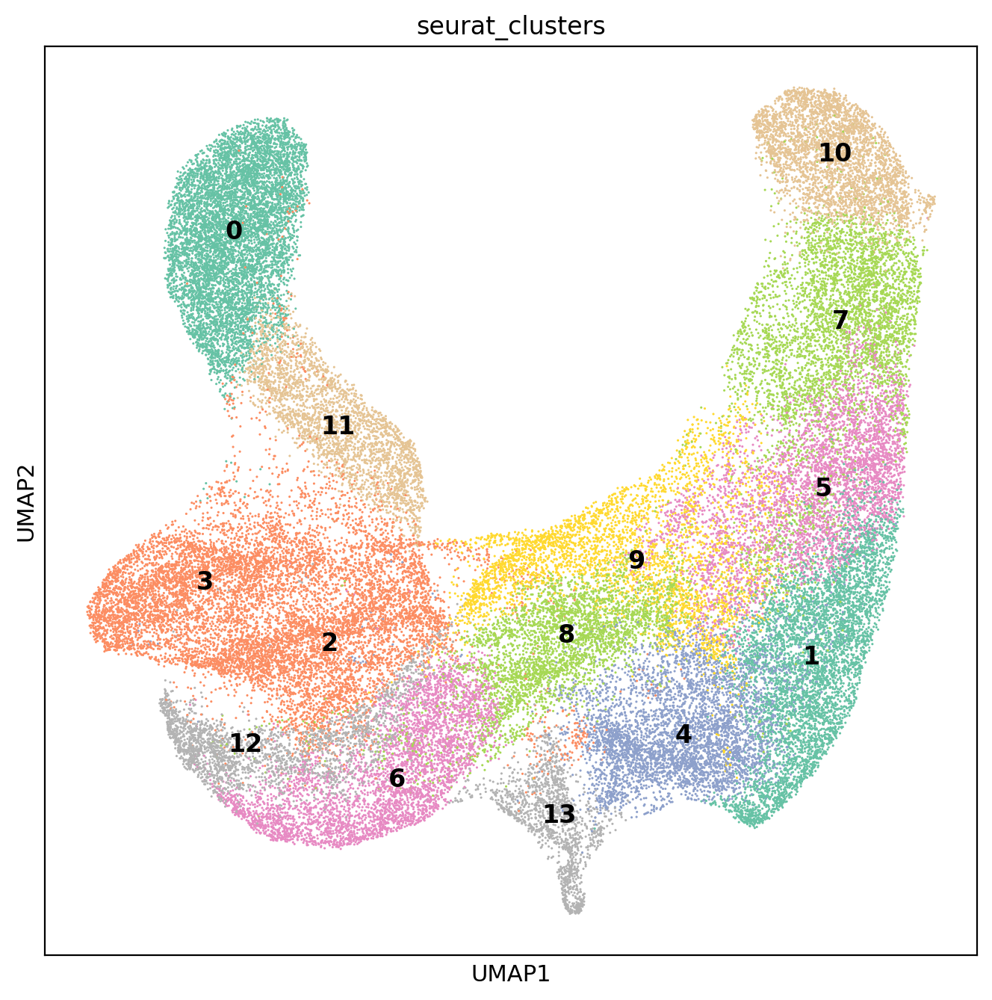

In [357]:
rcParams['figure.figsize'] = 8, 8

sc.pl.umap(rna, color="seurat_clusters", legend_loc='on data', palette="Set2", size=5)

### Velocity Stream Graphs on Gene Subsets

In [420]:
f = open("../20200828_RNA_Seurat/gene_sets/20201012_tmp_gridmap_znorm_n10/idx4.txt")
gene_set = [x.strip() for x in f]
f.close()
len(gene_set)

422

In [421]:
len(set(gene_set).intersection(set(rna.var.index)))

214

In [422]:
list(set(gene_set).intersection(set(rna.var.index)))[:10]

['PDZRN4',
 'CRISPLD1',
 'MID1IP1',
 'HBB',
 'PPP1R14C',
 'ARHGAP18',
 'LINC00707',
 'TBC1D32',
 'WDFY4',
 'AZGP1']

In [930]:
# fibroblast 
# gene_set = set(["AADAC","ACTA2","AFP","APOA1","APOC2","APOH","ASGR2","ASS1","C3","CAV1","CAV2","CCL2","CD55","CDH5","COL1A1","COL4A2","COL6A1","COL6A3","CXCL13","CYB5A","EDNRA","EGFL6","EHD2","ELN","EPAS1","FABP1","FBLN1","FGFR2","FGG","FN1","GC","GPR116","GRP","HGD","HIF1A","HIF3A","HPGD","ICAM1","IL6","IL8","KRT7","LAMA3","LAMC1","LOXL1","LPHN2","LTF","LUM","LURAP1L","LYVE1","MEOX2","MEST","MFAP4","MMP19","MMP2","MT2A","MUC1","MYH11","NAMPT","NAP1L1","NFKBIZ","NID1","PCOLCE","PFN1","PPIB","PTBP1","PTX3","PXDN","RARRES1","RBPMS","S100P","SERPINE1","SLC25A37","SLC39A14","SLC52A2","SMAD6","SOD2","TBX3","TCF21","THBS1","THY1","TIMP3","TM4SF1","TM4SF4","TNC","TNFAIP3","TNFAIP6","VAMP8"])

# pluripotency
# gene_set = set(["NANOG", "ZFP42", "NR0B1", "ESRRB", "FGF4", "DPPA4", "LIN28A", "MYCN", "DPPA2", "SALL4", "PRDM14", "DAZL", "TCL1", "KLF2", "KLF5", "LIN28B", "ID3", "UTF1", "ID2", "TERT", "GDF3"])

# from https://www.nature.com/articles/s41556-018-0088-1?platform=hootsuite#Sec33 "essentialome"
# gene_set = set(["URB2", "MYBL2", "KIF11", "POLA1", "SALL4", "CBX2", "CCNA2", "CLSPN", "SPC25", "POU5F1", "VRTN", "GINS2", "CHAF1A", "KIF4A", "USP9X", "IGF2BP1", "ERCC6L", "CDT1", "FANCB", "DSCC1", "ECT2", "TPX2", "PRDM14", "TDGF1", "TRIM71", "CSE1L", "AUNIP", "XRCC2", "TTK", "CDC25A", "CDC6", "TICRR", "MCM3", "SLC7A5", "ZNF730", "NANOG", "CENPF", "DPPA3", "SEPHS1", "BRIP1", "HMGB3", "MYCN", "FAM71F1", "FOXB1", "WDHD1", "MCM6", "JARID2", "LIN28B", "MIS18A", "ORC1"])

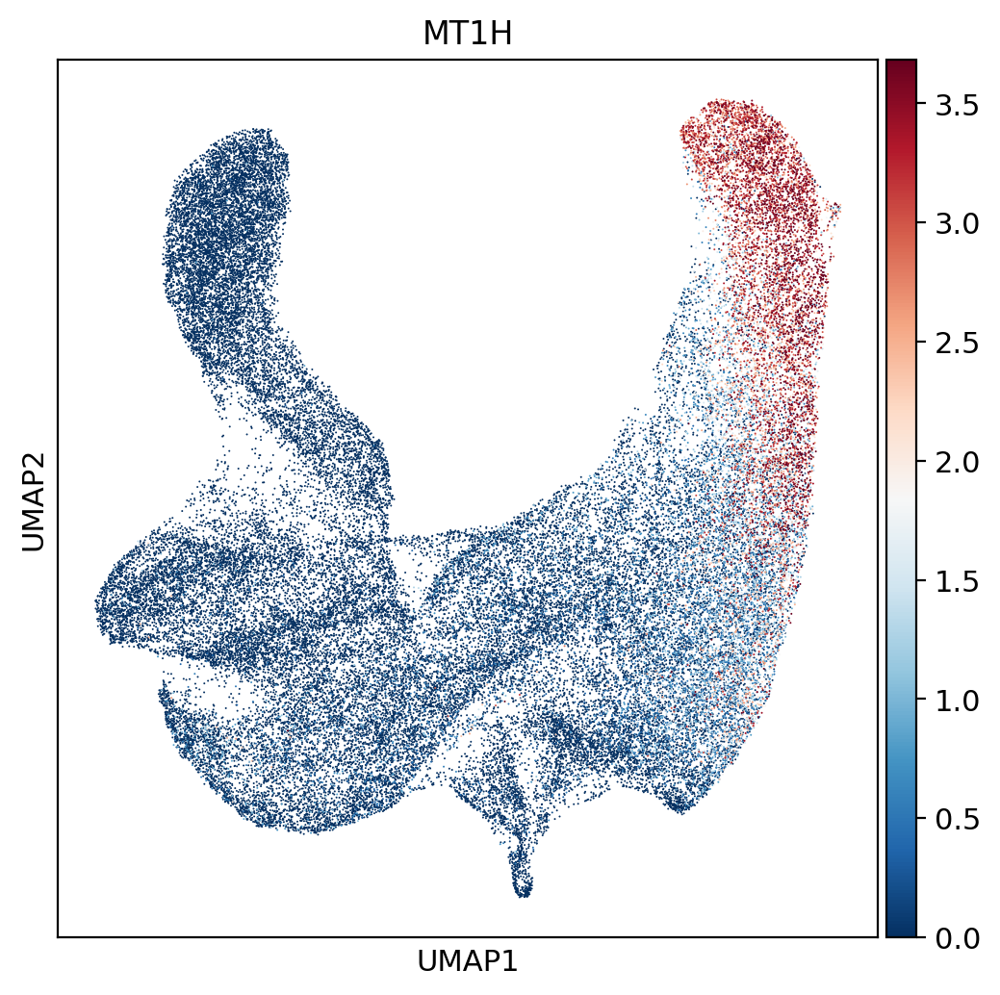

In [298]:
rcParams['figure.figsize'] = 6,6

sc.pl.umap(rna, color='MT1H', vmin='p1', vmax='p98')

In [ ]:
rcParams['figure.figsize'] = 12, 10

scv.pl.velocity(rna, 
#                 [df['16'][90]],
                ['MT1H'], 
#                 color="atac_transfer_cluster",
                color="seurat_clusters", palette="Set2",
                size=20, 
                fontsize=20,
                dpi=120,
                ncols=1)

In [424]:
subset = rna.layers['velocity'][:, [x in gene_set for x in rna.var.index]]
subset = subset[:, ~np.isnan(subset[0])]
subset.shape

(59369, 214)

In [425]:
# rna.obs['tmp'] = np.mean(subset, axis=1)
rna.obs['tmp'] = np.mean(np.sign(subset), axis=1) # avg of signs of velocities

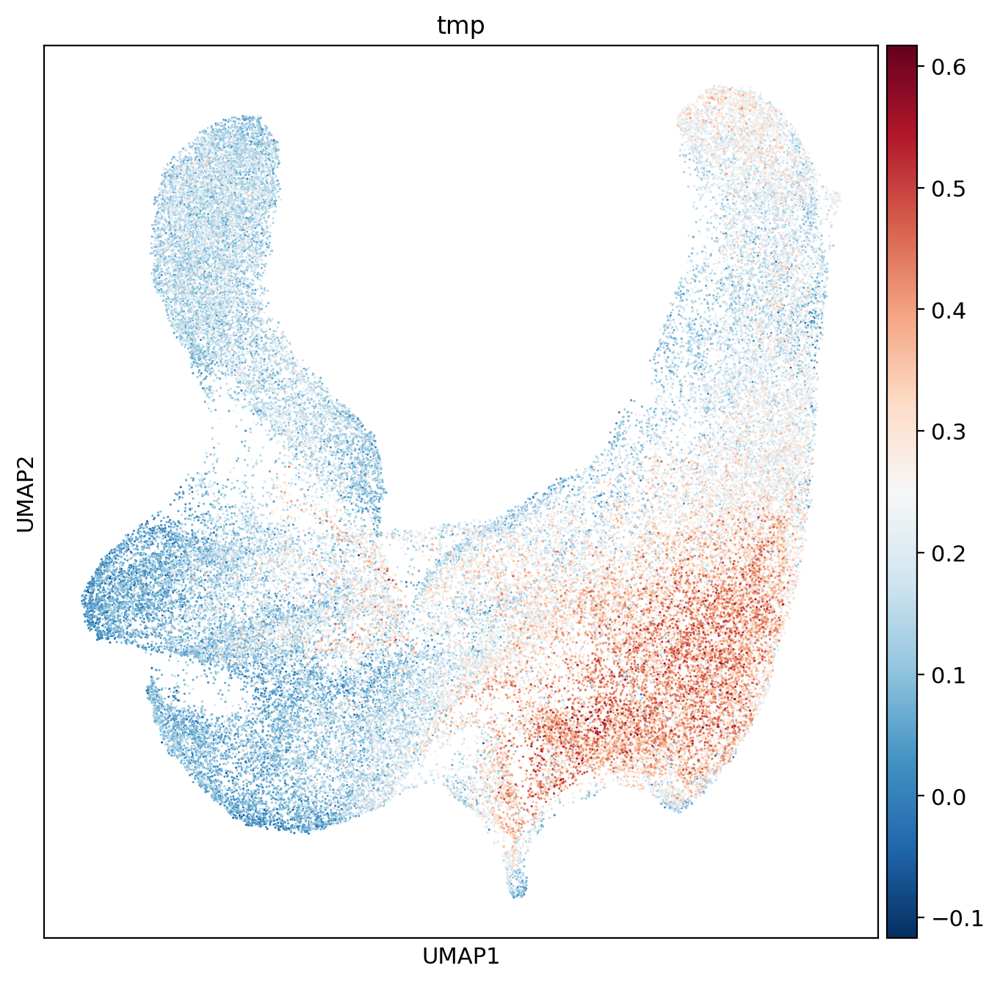

In [426]:
rcParams['figure.figsize'] = 8, 8

sc.pl.umap(rna, color="tmp",  size=5)

In [1129]:
# subset gene set to those used generally for velocity comp

In [427]:
gene_set = list(set(gene_set).intersection(rna.var["velocity_genes"].index[rna.var["velocity_genes"]]))

In [428]:
len(gene_set)

180

In [429]:
scv.tl.velocity_graph(rna, 
                      gene_subset=gene_set)
#                       gene_subset=["SERINC5", "TRIM71"])
#                           gene_subset=["DST"])                      
#                       gene_subset = ['MT1H', 'MT1F'])
#                       gene_subset=df['16'][:100])
#                       gene_subset=d)

SURAG UNCOMMENTED velocity_graph.py
computing velocity graph
    finished (0:00:54) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:18) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


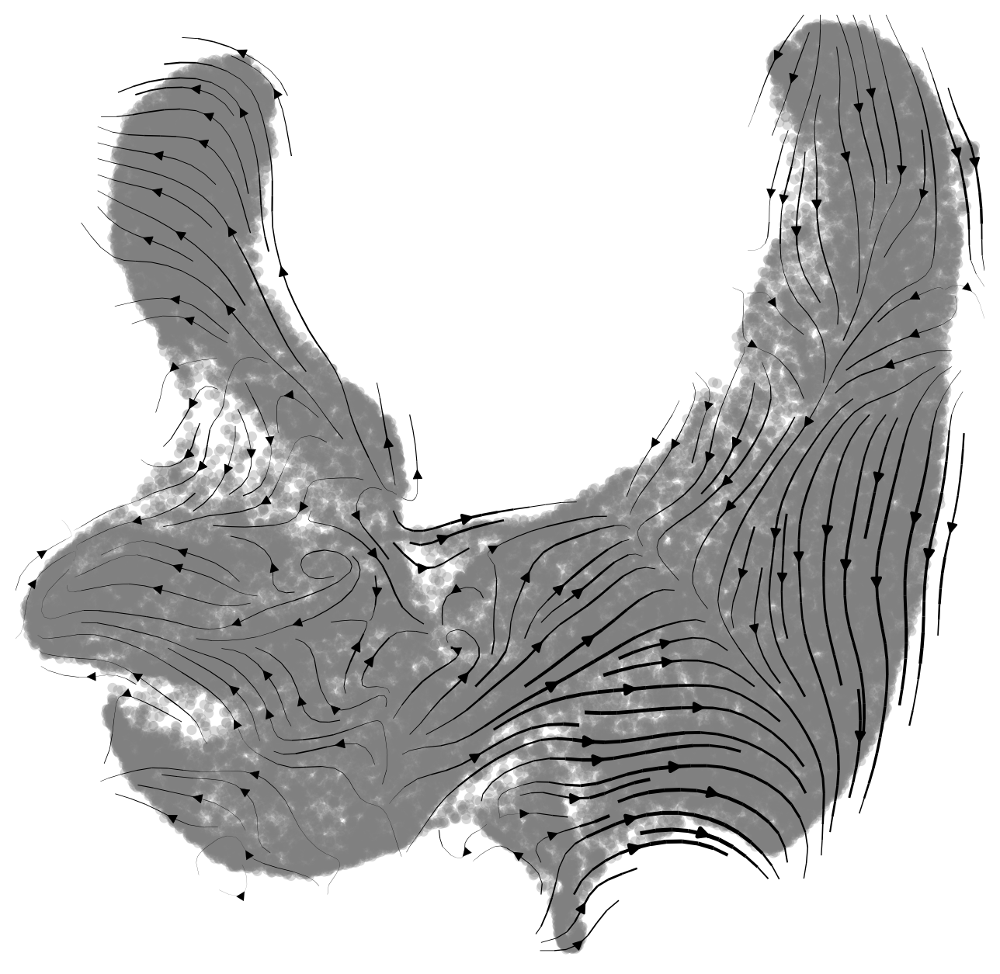

In [430]:
rcParams['figure.figsize'] = 8, 8

scv.pl.velocity_embedding_stream(rna, 
                                 basis='umap', 
                                 cutoff_perc=0, 
#                                  color="seurat_clusters",
#                                  save='stream.png',
#                                  dpi=120
                                )

In [15]:
from IPython.core.debugger import set_trace 

def debug():
    set_trace()
    scv.tl.velocity_graph(rna, 
    #                       gene_subset=gene_set)
                          gene_subset=["SERINC5", "TRIM71"])
    #                       gene_subset = ['MT1H', 'MT1F'])
    #                       gene_subset=df['16'][:100])
    #                       gene_subset=d)

In [ ]:
debug()

### Decomposing Velocity Cosine Similarity (PCA on Normalized Uncentered Data)

This is preferred over normal PCA since dot product similarity is more meaningful than cosine similarity-e.g. a gene might have velocity in the 0->1 range while another in the -1->0 range with reasonable correlation, but since sign of velocity matters that would not be ideal.

In [126]:
initial_select = ((~np.isnan(rna.layers['velocity'][0]) & (rna.var['velocity_genes'])))

subset = rna.layers['velocity'][:, initial_select]
subset_genes = rna.var.index[initial_select]

# remove those with all zeros
subset_genes = subset_genes[np.sum(subset, axis=0)!=0]
subset = subset[:, np.sum(subset, axis=0)!=0] 

print(len(subset_genes), subset.shape)

2551 (59369, 2551)


In [127]:
mag_scaled = subset/np.sqrt(np.sum(subset**2, axis=0, keepdims=True))

In [128]:
np.sum(mag_scaled**2, axis=0)[:10]

array([1.        , 0.9999999 , 1.        , 1.        , 1.        ,
       1.        , 0.99999994, 1.        , 1.        , 0.9999999 ],
      dtype=float32)

In [129]:
cosine_mat = np.dot(mag_scaled.T, mag_scaled)

In [130]:
idx = list(subset_genes).index("TRIM71")
idx

470

In [131]:
subset_genes[idx]

'TRIM71'

In [132]:
np.argsort(cosine_mat[idx])[::-1][:10]

array([ 470,  609,  659,  130,  783, 1850, 1282, 2212, 1757,  910])

In [133]:
np.sort(cosine_mat[idx])[::-1][:10]

array([1.0000002 , 0.7417514 , 0.7340186 , 0.7277995 , 0.7249791 ,
       0.70559496, 0.69625837, 0.6962203 , 0.68283355, 0.6696154 ],
      dtype=float32)

In [134]:
np.min(cosine_mat)

-0.7440805

In [135]:
w,v = np.linalg.eig(cosine_mat)

In [139]:
w/sum(w)

array([1.8126570e-01, 4.7200881e-02, 2.4774745e-02, ..., 8.6654327e-05,
       8.7538901e-05, 8.7440196e-05], dtype=float32)

In [137]:
np.sum(v[:,0]<0)

2395

In [340]:
# subset_genes[np.argsort(v[:,0])][::-1][:100]
subset_genes[np.argsort(v[:,0])][:100]

Index(['MAML2', 'FNIP1', 'TANC2', 'CLIP2', 'EVL', 'NR3C1', 'TTC28', 'MEIS1',
       'ZBTB20', 'NIBAN2', 'NUMB', 'MAML3', 'STARD13', 'PTEN', 'MIR4435-2HG',
       'REV3L', 'SSH1', 'TCF4', 'RASSF8', 'ZFP36L1', 'PPP3CA', 'MBNL2',
       'GSTK1', 'MICU3', 'GLI3', 'SEC24D', 'TANK', 'TEAD1', 'PPP2R3A', 'SOX5',
       'RBMS3', 'TENM4', 'MALAT1', 'KAT6B', 'SOD2', 'TRIO', 'BMERB1', 'PARP4',
       'SUSD6', 'ST5', 'MCC', 'GRK5', 'TNIP1', 'LPP', 'RIN2', 'SLF2', 'PSD3',
       'PRAG1', 'TNS3', 'RFTN1', 'SIK2', 'TGFB1', 'ANTXR2', 'SSBP2', 'BACH2',
       'EXT1', 'SLC38A6', 'NFIX', 'PRKD1', 'DNAJC1', 'EYA4', 'TNIK', 'LYST',
       'CERCAM', 'NAALADL2', 'CDK6', 'FBN1', 'TBC1D19', 'CLMP', 'DENND2A',
       'JAK2', 'SRGAP1', 'DDR2', 'DST', 'SH3RF3', 'TNS1', 'LAMB1', 'CTSB',
       'ANTXR1', 'SMG6', 'FAM171A1', 'CEMIP2', 'RBMS2', 'WASF3', 'RIN3',
       'PTK7', 'RPS6KA2', 'CACNA1C', 'ARID5B', 'HGSNAT', 'P3H4', 'COL4A2',
       'DOCK10', 'PPARA', 'SNX9', 'WWTR1', 'ZNF521', 'MEF2A', 'WIPF1', 'AHI1'],
    

In [362]:
f = open("tmp.txt", 'w')
for x in subset_genes[np.argsort(v[:,0])][:500]:
    f.write(x)
    f.write("\n")
f.close()

In [1090]:
# WHY is min 0 (for dynamical)??
np.min(list(rna.layers['velocity'][:, [x=="DAP" for x in rna.var.index]][:,0]))

-0.63088125

In [1091]:
# WHY is min 0 (for dynamical)??
np.sum(rna.var['velocity_genes'].values & (np.min(rna.layers['velocity'], axis=0)==0))

0

In [84]:
from sklearn.decomposition import PCA

In [143]:
pca = PCA(n_components=10, whiten=True)

In [144]:
pca.fit(subset)

PCA(copy=True, iterated_power='auto', n_components=10, random_state=None,
    svd_solver='auto', tol=0.0, whiten=True)

In [145]:
subset.shape

(59369, 2551)

In [146]:
pca.explained_variance_ratio_

array([0.7538769 , 0.0616935 , 0.01842764, 0.01551131, 0.01287381,
       0.01172474, 0.00818324, 0.00601873, 0.00547579, 0.00466934],
      dtype=float32)

In [147]:
np.sum(pca.components_[0]<0)

1344

In [148]:
subset_genes[np.argsort(pca.components_[0])][:50]

Index(['MALAT1', 'TRIO', 'FN1', 'SERF2', 'RPS3', 'TIMP3', 'TNC', 'EXT1', 'B2M',
       'BNC2', 'SOX5', 'MFAP4', 'TUBA1C', 'TPM4', 'MAML2', 'SGIP1', 'COL6A3',
       'LMNA', 'EMP1', 'ZEB1', 'NAALADL2', 'CALD1', 'PRKCA', 'THSD4',
       'MIR4435-2HG', 'STARD13', 'SMAD3', 'ZBTB20', 'SNED1', 'MYO10', 'NQO1',
       'DCN', 'AFF3', 'ABCC4', 'CRIM1', 'LPP', 'TENM4', 'HIPK2', 'NCKAP5',
       'NAV1', 'DLC1', 'NAV2', 'ANTXR1', 'MMP2', 'BICC1', 'HMGA2', 'COL6A2',
       'CDK2AP1', 'COL4A5', 'EYA4'],
      dtype='object')

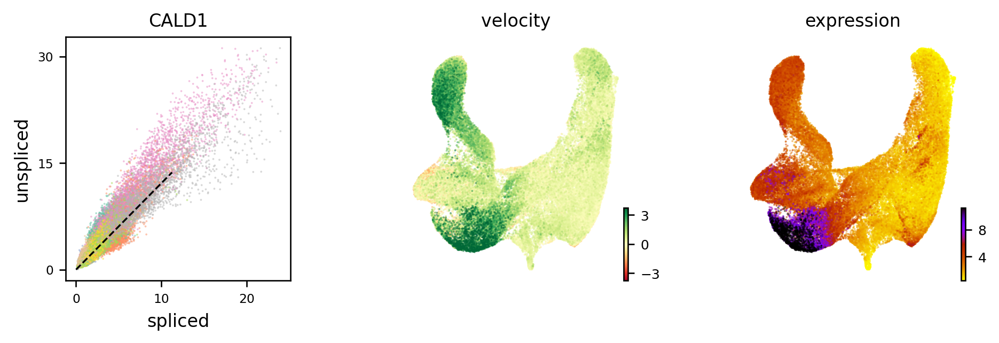

In [365]:
rcParams['figure.figsize'] = 6, 5

scv.pl.velocity(rna, 
#                 [df['16'][90]],
                ['CALD1'], 
#                 color="atac_transfer_cluster",
                color="seurat_clusters", palette="Set2",
                size=5, 
                fontsize=10,
                dpi=120,
                ncols=1)

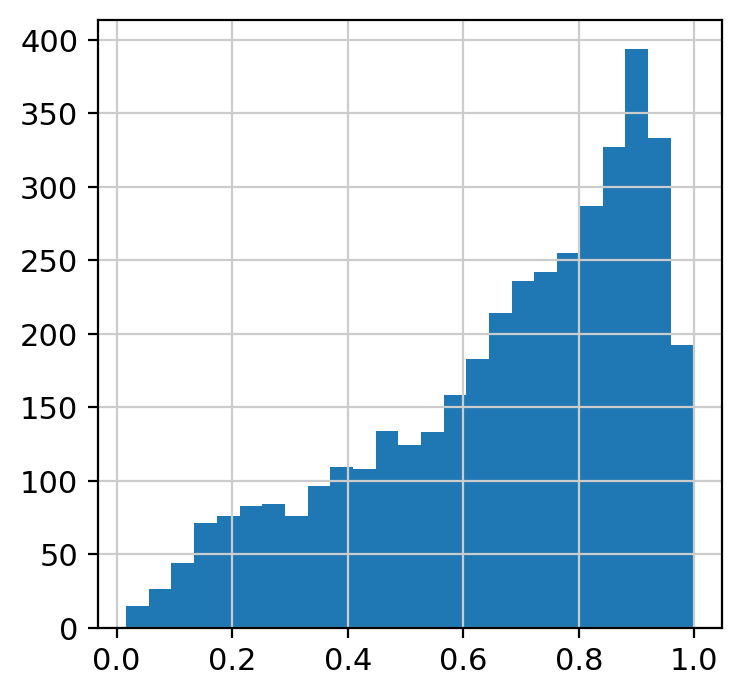

In [359]:
rcParams['figure.figsize'] = 4, 4
pd.DataFrame(rna.layers['velocity']>=0).mean(0).hist(bins=25)

### Top Likelihood Genes (Dynamical)

In [ ]:
top_genes = rna.var['fit_likelihood'].sort_values(ascending=False).index

In [ ]:
scv.pl.scatter(rna, 
               basis=top_genes[:15], 
               ncols=5, 
               fontsize=30, size=10,
#                color="atac_transfer_cluster",
               color="seurat_clusters", palette="Set2",
               frameon=True)

### Speed and Coherence

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)


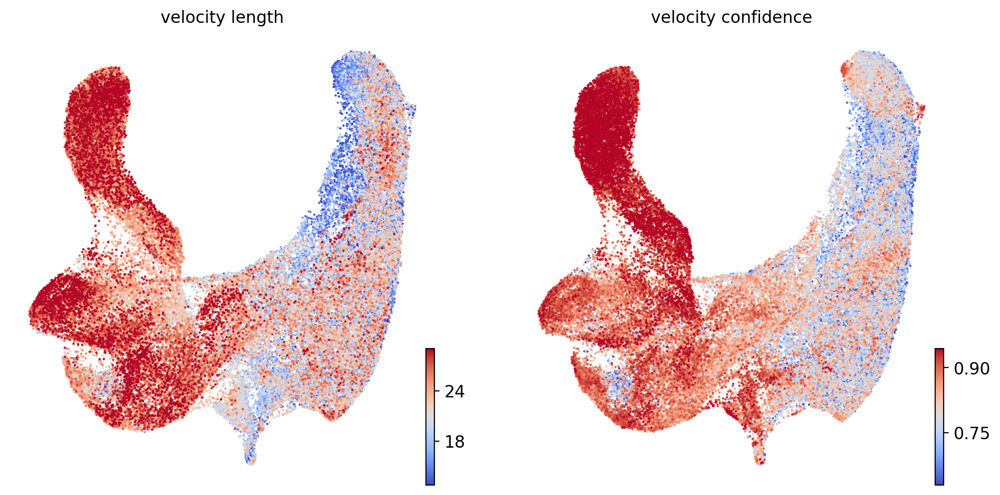

In [444]:
rcParams['figure.figsize'] = 6, 6

scv.tl.velocity_confidence(rna)
keys = 'velocity_length', 'velocity_confidence'
scv.pl.scatter(rna, c=keys, cmap='coolwarm', perc=[5, 95])